# Hierarchical VAE


This practice session allows to train a top-down hierarchical VAE.

This is a toy implementation of the NVAE model with a simple MSE reconstruction loss and only three stages.

![alternatvie text](https://raw.githubusercontent.com/generativemodelingmva/generativemodelingmva.github.io/main/tp2324/toynvae_framework_full.png)


On the left is the encoder & decoder scheme for training, on the right is the generative model, i.e., the decoder.

Sources:
* Toy implementation from: https://github.com/GlassyWing/nvae
* NVAE official implementation: https://github.com/NVlabs/NVAE
* NVAE paper: "NVAE: A Deep Hierarchical Variational Autoencoder", Arash Vahdat and Jan Kautz (NeurIPS 2020 Spotlight Paper) https://arxiv.org/abs/2007.03898
* CelebA validation set (used for training): https://www.kaggle.com/datasets/jessicali9530/celeba-dataset


The neural networks implementing an encoder $q(z|x)$ and generative model
 $p(x|z)$ for a 3-group hierarchical VAE. $r$
denotes residual neural networks, + denotes feature combination (e.g.,
 concatenation), and $h$ is a trainable parameter.

The originality of this autoencoder lies in its hierarchical structure. The latent space is organised in $s$ layers  $\{z_1, z_2, \cdots, z_s\}$ with priors $p(\mathbf{z}) = \prod\limits_{l = 1}^s p(z_l |z_{<l})$. At each is associated a degree of depth in the latent space. The encoder goes through the layers in the decreasing order, while the encoder goes in the opposite way. Therefore, $z_1$ represents the deepest latent variable.

Consider first the training step (left picture).

As always in VAE, the image is fed to the encoder.
The encoder step begins this way (red lines) : an input image $x$ goes through $s$ successive residual neurals networks, noted $\{e_s, e_{s - 1}, \cdots, e_1\}$, with every output $o_s^e, \cdots, o^1_1$ stored in memory... And that's it. It concludes the encoder.

Consider now we wish to employ the decoder (blue lines). There is two cases: either the encoder has been employed (training phase, noted case I), or we directly sample from $p(z_1)$ (test phase, noted case II).

$\mathbf{Case \, I}$

At the very deepest layer, the latent variable $z_1$ is sampled thanks to a probabilistic model $q(z_1|o^1_1)$. This sample is combined in some way with the deterministic parameter $h$. After that, the result goes through another residual network $d_1$, with output noted $o_2^2$.

This output is then combined with $o_2^1$, and the latent variable $z_2$ is sampled thanks to a probabilistic model $q(z_2| o^2_2, o^1_2)$. As $o^2_2$ and $o^1_2$ are determinist quantities for a fixed image $x$ and latent variable $z_1$, the probabilistic relation ship is rather written $q(z_2|z_1,x)$.

This process is repeated until the final latent variable $z_s$ is sampled. Eventually, at the end, we have a whole cascad of latent variables $z_1, \cdots, z_s$, with a probabilistic relationship $q(z_1|x)$ for $z_1$ and $q(z_l|z_{<l})$ for the others.

$\mathbf{Case \, II}$

As before, $z_1$ is sampled and combined with $h$. Then it goes through the residual neural network $d_1$ (note that it is the same that in the encoding stage) to output $r_2$. With this information, the latent variable $z_2$ is sampled from $z_2 \sim q(z_2|z_1)$. This sample is combined with $r_2$ to form a new output that will be used to sample $z_3$ and so on.
The process repeats until $z_s$ has been sampled and combined with $r_s$. A final residual neural network is used to output the generated image $x$.



# Download files

In [ ]:
# do just once:
!wget -nc -O celeba64png_val.zip 'https://www.dropbox.com/scl/fi/3d2le2wlu61nzkbxymfm3/celeba64png_val.zip?rlkey=ckesud01kwb8tualsd3s8zg5d'
!unzip -nq celeba64png_val.zip
!ls val | wc -l # there should be 19867 files

File ‘celeba64png_val.zip’ already there; not retrieving.
19867


In [ ]:
import argparse
import os
import time
from glob import glob
from datetime import datetime

from PIL import Image

import matplotlib.pyplot as plt
import numpy as np

import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import torch.nn as nn
import torch.nn.functional as F
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print(device)

cuda:0


In [ ]:
from PIL import Image
class PngImageFolderDataset(Dataset):

    def __init__(self, image_dir):
        self.img_paths = sorted(glob(os.path.join(image_dir, "*.png")))

    def __getitem__(self, idx):
        return torchvision.transforms.ToTensor()(Image.open(self.img_paths[idx]))

    def __len__(self):
        return len(self.img_paths)

train_ds = PngImageFolderDataset('val')


# Model

## Losses for training

$\newcommand{\bx}{\mathbf{x}} % bold x$
$\newcommand{\bz}{\mathbf{z}} % bold z$
$\newcommand{\DKL}{D_{\mathrm{KL}}}$
$\newcommand{\E}{\mathbb{E}}$
$\newcommand{\bmu}{{\mathbf{\mu}}} % bold mu$
$\newcommand{\bsigma}{{\mathbf{\sigma}}} % bold Sigma$
$\newcommand{\diag}{\operatorname{diag}}$
The training loss for the hierarchical VAE is
$$
    \mathcal{L}_{\text{VAE}}(\bx) :
    = \E_{q(\bz|\bx)}\left[ \log p(\bx|\bz) \right] - \DKL(q(\bz_1|\bx)|p(\bz_1)) - \sum_{l=2}^L \E_{q(\bz_{<l}|\bx)} \left[ \DKL(q(\bz_l|\bx, \bz_{<l})|p(\bz_l|\bz_{<l})) \right]
$$
Each expectation term will be approximated by a one sample approximation using the parameterization trick.
For this practice session, we use normal distribution for all terms.

Following the NVAE paper, we suppose that
$
p(\bz_l|\bz_{<l}) = \mathcal{N} \left(\bmu(\bz_{<l}), \diag{\bsigma^2}(\bz_{<l}) \right)
$
,
$$
q(\bz_l|\bz_{<l}, \bx) = \mathcal{N} \left(\bmu(\bz_{<l}) + \Delta \bmu(\bz_{<l}, \bx), \diag\left(\bsigma^2(\bz_{<l}) \cdot \Delta \bsigma^2(\bz_{<l}, \bx)\right) \right).
$$
for $l > 1$ and $p(z_1) = \mathcal{N}\left(\bmu, \diag\left(\bsigma^2\right) \right)
$, $q(z_1|x) = \mathcal{N}\left(\bmu + \Delta \bmu(\bx), \diag\left(\bsigma^2 \cdot \Delta \bsigma^2(\bx)\right) \right)
$ for $l = 1$.

The objective of the training phase is therefore to tune the parameters $\Delta \mu(\mathbf{z}_{<l}, \mathbf{x})$ and $\Delta \sigma^2(\mathbf{z}_{<l}, \mathbf{x})$ to minimize $\mathcal{L}_{VAE}(\mathbf{x})$.

### Exercise 1:
1. Compute the expression of
$\DKL(q(\bz_l|\bx, \bz_{<l})|p(\bz_l|\bz_{<l}))$
in function of $\Delta \bmu(\bz_{<l}, \bx)$, $\Delta \bsigma^2(\bz_{<l}, \bx)$ and ${\bsigma^2}(\bz_{<l})$. \\
One finds the following expression from "NVAE: A Deep Hierarchical Variational Autoencoder" for $\mathbf{z}_l, \mathbf{z}_{<l} \in \mathbb{R}^n$: $\DKL(q(\bz_l|\bx, \bz_{<l})|p(\bz_l|\bz_{<l}))
 = \displaystyle\frac{1}{2}\sum\limits_{i = 1}^{N_{\text{batch}}}\big(\Delta\sigma_i^2(\bz_{<l}, \bx) + \displaystyle\frac{\Delta\mu_i^2(\bz_{<l}, \bx)}{\sigma_i^2(\bz_{<l})} - \log(\Delta\sigma_i^2(\bz_{<l}, \bx)) - 1\big).$


2. Implement a function **kl_delta(delta_mu, delta_log_var, mu, log_var)** that computes $\DKL(q(\bz_l|\bx, \bz_{<l})|p(\bz_l|\bz_{<l}))$ in function of its parameters (note that the decoder outputs the logarithm of the diagonal variances).

In [ ]:
# utils functions for training and sampling:

def kl(mu, log_var):
    """
    kl loss with standard norm distribute
    :param mu:
    :param log_var:
    :return:
    """
    loss = - 0.5 * torch.sum(1 + log_var - mu ** 2 - torch.exp(log_var), dim = [1, 2, 3])
    return torch.mean(loss, dim=0)

def kl_delta(delta_mu, delta_log_var, mu, log_var):
    """
    KL loss between posterior and prior
    """

    var = torch.exp(log_var)
    delta_var = torch.exp(delta_log_var)

    loss = - 0.5 * torch.sum(1 + delta_log_var - delta_mu ** 2 / var - delta_var, dim=[1, 2, 3])
    return torch.mean(loss, dim = 0)

def reparameterize(mu, std):
    z = torch.randn_like(mu) * std + mu
    return z

from torch.nn.utils import spectral_norm
def add_sn(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        return spectral_norm(m)
    else:
        return m

### Common layers

In [ ]:
#from nvae.common import Swish, DecoderResidualBlock, ResidualBlock

class Swish(nn.Module):

    def __init__(self):
        super().__init__()

    def forward(self, x):
        return x * torch.sigmoid(x)

class SELayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SELayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class DecoderResidualBlock(nn.Module):

    def __init__(self, dim, n_group):
        super().__init__()

        self._seq = nn.Sequential(
            nn.Conv2d(dim, n_group * dim, kernel_size=1),
            nn.BatchNorm2d(n_group * dim), Swish(),
            nn.Conv2d(n_group * dim, n_group * dim, kernel_size=5, padding=2, groups=n_group),
            nn.BatchNorm2d(n_group * dim), Swish(),
            nn.Conv2d(n_group * dim, dim, kernel_size=1),
            nn.BatchNorm2d(dim),
            SELayer(dim))

    def forward(self, x):
        return x + 0.1 * self._seq(x)

class ResidualBlock(nn.Module):

    def __init__(self, dim):
        super().__init__()
        self._seq = nn.Sequential(
            nn.Conv2d(dim, dim, kernel_size=5, padding=2),
            nn.Conv2d(dim, dim, kernel_size=1),
            nn.BatchNorm2d(dim), Swish(),
            nn.Conv2d(dim, dim, kernel_size=3, padding=1),
            SELayer(dim))

    def forward(self, x):
        return x + 0.1 * self._seq(x)

### Encoder architecture
There is no hierarchical structure for the encoder, i.e we do not need to know $z_{l}$ to deduce $z_{l-1}$. So the structure is very similar to a classic encoder.

In [ ]:
# Encoder:
class ConvBlock(nn.Module):
    def __init__(self, in_channel, out_channel):
        super().__init__()

        self._seq = nn.Sequential(

            nn.Conv2d(in_channel, out_channel, kernel_size=3, padding=1),
            nn.Conv2d(out_channel, out_channel // 2, kernel_size=1),
            nn.BatchNorm2d(out_channel // 2), Swish(),
            nn.Conv2d(out_channel // 2, out_channel, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(out_channel), Swish()
        )

    def forward(self, x):
        return self._seq(x)

class EncoderBlock(nn.Module):

    def __init__(self, channels):
        super().__init__()
        self.channels = channels
        modules = []
        for i in range(len(channels) - 1):
            modules.append(ConvBlock(channels[i], channels[i + 1]))

        self.modules_list = nn.ModuleList(modules)

    def forward(self, x):
        for module in self.modules_list:
            x = module(x)
        return x

class EncoderResidualBlock(nn.Module):

    def __init__(self, dim):
        super().__init__()

        self.seq = nn.Sequential(

            nn.Conv2d(dim, dim, kernel_size=5, padding=2),
            nn.Conv2d(dim, dim, kernel_size=1),
            nn.BatchNorm2d(dim), Swish(),
            nn.Conv2d(dim, dim, kernel_size=3, padding=1),
            SELayer(dim))

    def forward(self, x):
        return x + 0.1 * self.seq(x)

class Encoder(nn.Module):

    def __init__(self, z_dim):
        super().__init__()
        self.encoder_blocks = nn.ModuleList([
            EncoderBlock([3, z_dim // 16, z_dim // 8]),  # (16, 16)
            EncoderBlock([z_dim // 8, z_dim // 4, z_dim // 2]),  # (4, 4)
            EncoderBlock([z_dim // 2, z_dim]),  # (2, 2)
        ])

        self.encoder_residual_blocks = nn.ModuleList([
            EncoderResidualBlock(z_dim // 8),
            EncoderResidualBlock(z_dim // 2),
            EncoderResidualBlock(z_dim),
        ])

        self.condition_x = nn.Sequential(
            Swish(),
            nn.Conv2d(z_dim, z_dim * 2, kernel_size=1)
        )

    def forward(self, x):
        xs = [] #Represents the intermediate value taken by x after a encoder+encoder_residual block
        for e, r in zip(self.encoder_blocks, self.encoder_residual_blocks):
            x = r(e(x))
            xs.append(x)

        mu, log_var = self.condition_x(x).chunk(2, dim=1) #q(z|x)

        return mu, log_var, xs[:-1][::-1]

### Decoder architecture with shared top-down encoder/decoder

In [ ]:
# Decoder:
class UpsampleBlock(nn.Module):
    def __init__(self, in_channel: int, out_channel: int):
        super().__init__()

        self._seq = nn.Sequential(
            nn.ConvTranspose2d(in_channel,
                               out_channel,
                               kernel_size=3,
                               stride=2,
                               padding=1,
                               output_padding=1),
            # nn.UpsamplingBilinear2d(scale_factor=2),
            # nn.Conv2d(in_channel, out_channel, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channel), Swish(),
        )

    def forward(self, x):
        return self._seq(x)

class DecoderResidualBlock(nn.Module):
    def __init__(self, dim: int, n_group: int):
        super().__init__()

        self._seq = nn.Sequential(
            nn.Conv2d(dim, n_group * dim, kernel_size=1),
            nn.BatchNorm2d(n_group * dim), Swish(),
            nn.Conv2d(n_group * dim, n_group * dim, kernel_size=5, padding=2, groups=n_group),
            nn.BatchNorm2d(n_group * dim), Swish(),
            nn.Conv2d(n_group * dim, dim, kernel_size=1),
            nn.BatchNorm2d(dim),
            SELayer(dim))

    def forward(self, x):
        return x + 0.1 * self._seq(x)

# Concatenation of UpsampleBlock
class DecoderBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.channels = channels
        modules = []
        for i in range(len(channels) - 1):
            modules.append(UpsampleBlock(channels[i], channels[i + 1]))
        self.module_list = nn.ModuleList(modules)

    def forward(self, x):
        for module in self.module_list:
            x = module(x)
        return x

# The decoder has two types of NN blocks: decoder_blocks and decoder_residual_blocks.
# The concatenation of both constitues a forward to step from a stage to another.
class Decoder(nn.Module):
    def __init__(self, z_dim):
        super().__init__()
        # Input channels = z_channels * 2 = x_channels + z_channels
        # Output channels = z_channels
        self.decoder_blocks = nn.ModuleList([
            DecoderBlock([z_dim * 2, z_dim // 2]),  # 2x upsample
            DecoderBlock([z_dim, z_dim // 4, z_dim // 8]),  # 4x upsample
            DecoderBlock([z_dim // 4, z_dim // 16, z_dim // 32])  # 4x uplsampe
        ])
        self.decoder_residual_blocks = nn.ModuleList([
            DecoderResidualBlock(z_dim // 2, n_group=4),
            DecoderResidualBlock(z_dim // 8, n_group=2),
            DecoderResidualBlock(z_dim // 32, n_group=1)
        ])

        # p(z_l | z_(l-1)) prior. Its output is
        self.condition_z = nn.ModuleList([
            nn.Sequential(
                ResidualBlock(z_dim // 2),
                Swish(),
                nn.Conv2d(z_dim // 2, z_dim, kernel_size=1)
            ),
            nn.Sequential(
                ResidualBlock(z_dim // 8),
                Swish(),
                nn.Conv2d(z_dim // 8, z_dim // 4, kernel_size=1)
            )
        ])

        # q(z_l | x, z_(l-1)) posterior
        self.condition_xz = nn.ModuleList([
            nn.Sequential(
                ResidualBlock(z_dim),
                nn.Conv2d(z_dim, z_dim // 2, kernel_size=1),
                Swish(), # activation function
                nn.Conv2d(z_dim // 2, z_dim, kernel_size=1)
            ),
            nn.Sequential(
                ResidualBlock(z_dim // 4),
                nn.Conv2d(z_dim // 4, z_dim // 8, kernel_size=1),
                Swish(), #activation function
                nn.Conv2d(z_dim // 8, z_dim // 4, kernel_size=1)
            )
        ])

        # Neural network to generate an image from the latent space
        self.recon = nn.Sequential(
            ResidualBlock(z_dim // 32),
            nn.Conv2d(z_dim // 32, 3, kernel_size=1),
        )


    def forward(self, z, xs=None):
        """

        :param z: shape. = (B, z_dim, map_h, map_w)
        if xs=None: sample mode; otherwise xs is list of intermediate encoder features
        """

        B, D, map_h, map_w = z.shape

        # The init h (hidden state), can be replaced with learned param, but it didn't work much
        decoder_out = torch.zeros(B, D, map_h, map_w, device=z.device, dtype=z.dtype)

        kl_losses = []

        for i in range(len(self.decoder_residual_blocks)):

            z_sample = torch.cat([decoder_out, z], dim=1)
            decoder_out = self.decoder_residual_blocks[i](self.decoder_blocks[i](z_sample))

            if i == len(self.decoder_residual_blocks) - 1: # stop if last block
                break

            mu, log_var = self.condition_z[i](decoder_out).chunk(2, dim = 1) # parameter for sampling next z

            if xs is not None: #xs is not None if an encoder step has been applied before
                delta_mu, delta_log_var = self.condition_xz[i]( #delta calculated by the decoder
                                torch.cat([xs[i], decoder_out], dim=1)).chunk(2, dim=1) #see the  ELBO in the paper
                kl_losses.append(kl_delta(delta_mu, delta_log_var, mu, log_var))
                mu = mu + delta_mu
                log_var = log_var + delta_log_var

            z = reparameterize(mu, torch.exp(0.5 * log_var)) #Sample a z from a gaussian law with mean mu and std exp(log(var))

        x_hat = torch.sigmoid(self.recon(decoder_out))

        return x_hat, kl_losses

    def sample(self, n_samples=32, fix_level=-1):
      """
      n_samples: number of images to sample
      fix_level=-1: if fix_level = 0, (resp. 1) all samples have the same z0 (resp. z0 and z1)
      """
      z = torch.randn((1,512,2,2)).to(device) #Sample in the latent space

      genimages = torch.zeros((n_samples, 3, 64, 64)).to(device) #Variable to store the images

      for i in range(n_samples):
        genimages[i] = model.decoder(z)[0]
      return genimages

In [ ]:
class NVAE(nn.Module):

    def __init__(self, z_dim, img_dim):
        super().__init__()

        self.encoder = Encoder(z_dim)
        self.decoder = Decoder(z_dim)

    def forward(self, x):
        """
        :param x: Tensor. shape = (B, C, H, W) B for batch, C for colour, H for height and W for width
        :return:
        """

        mu, log_var, xs = self.encoder(x) #mean and log_var of the deepest latent variable

        # (B, D_Z)
        z = reparameterize(mu, torch.exp(0.5 * log_var)) # sampling top latent variable

        decoder_output, kl_losses = self.decoder(z, xs) #Sampling image

        kl_losses = [kl(mu, log_var)] + kl_losses #Recall the expectation is computed with only one sample

        recon_loss = nn.MSELoss(reduction='sum')(decoder_output, x)/decoder_output.shape[0] #Loss done by the reconstruction

        return decoder_output, recon_loss, kl_losses

Display the decoder output, $\textbf{before}$ training.

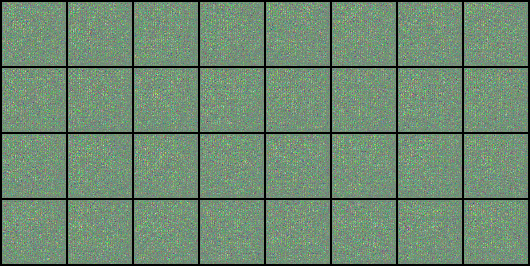

In [ ]:
import torchvision

def imshow(img):
    #img = img*0.5 + 0.5     # unnormalize
    pil_img = torchvision.transforms.functional.to_pil_image(img)
    display(pil_img)
    #print("Image size (h x w): ",  pil_img.height, "x", pil_img.width)
    return(pil_img)

batch_size = 128

model = NVAE(z_dim=512, img_dim=(64, 64)).to(device)

def show_decoder_output(z=None):
  # provide random latent code as option to see evolution
  with torch.no_grad():
    if z==None:
      z = torch.randn((batch_size,512,2,2)).to(device)
      # We use full batch size and then select first 32 images
    genimages = model.decoder(z)[0] #on utilise le decoder, et pas l'encoder qui a uniquement servi pour l'entraînement
    pil_img = imshow(torchvision.utils.make_grid(genimages[:32,:,:,:].to('cpu'),nrow=8))
  return(pil_img)

show_decoder_output();

# Training

### Exercise 2:
1. Display an image of 4x8 portraits from the training dataset.
1. Read the model architecture and train for 5 epochs.
1. How do you explain the difference of images generated with and without model.eval()?


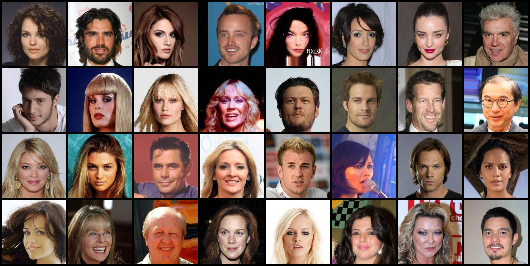

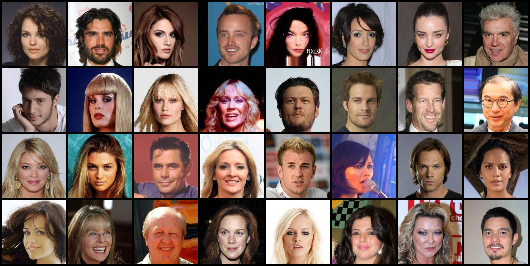

In [ ]:
img = torch.zeros(32,3,64,64)
for i in range(8*4):
  img[i] = train_ds.__getitem__(i)
imshow(torchvision.utils.make_grid(img.to('cpu'), nrow = 8))

---- [Epoch 0/100, Step 0/156] loss: 1996.438843----
Train mode


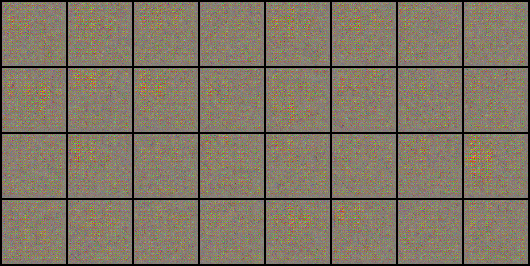

Eval mode


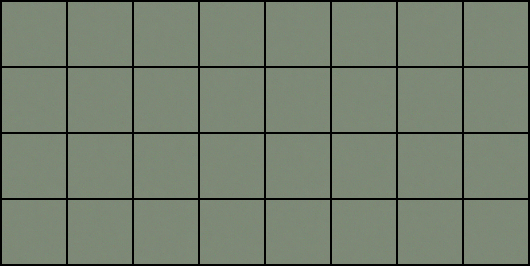

---- [Epoch 0/100, Step 100/156] loss: 381.079315----
Train mode


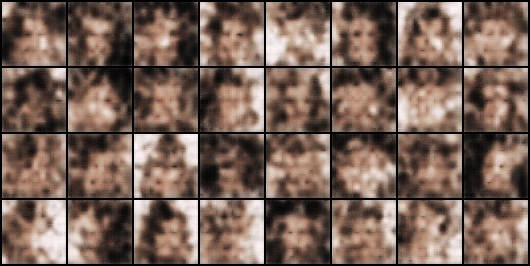

Eval mode


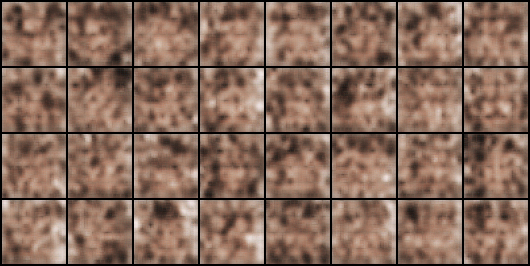

---- [Epoch 1/100, Step 0/156] loss: 348.266174----
Train mode


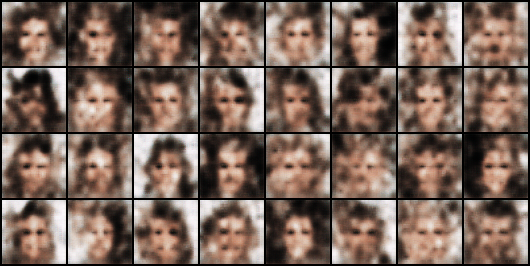

Eval mode


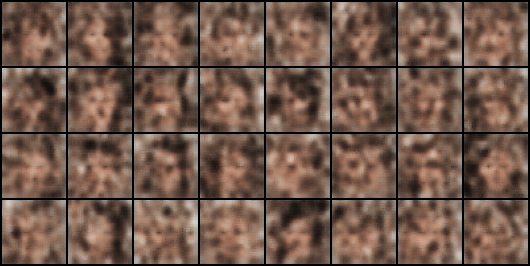

---- [Epoch 1/100, Step 100/156] loss: 324.021362----
Train mode


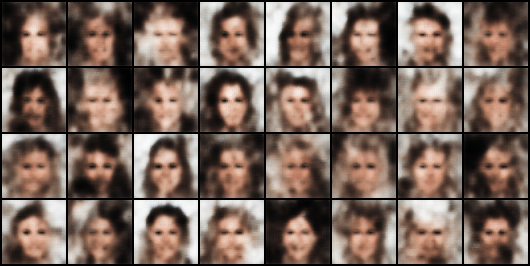

Eval mode


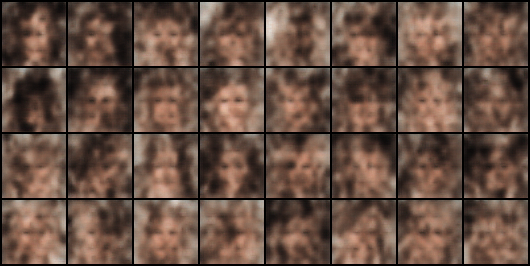

---- [Epoch 2/100, Step 0/156] loss: 303.663727----
Train mode


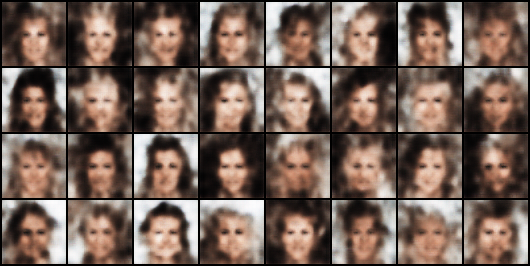

Eval mode


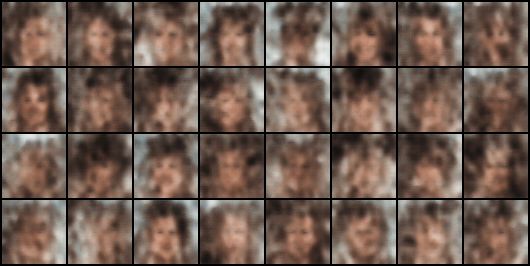

---- [Epoch 2/100, Step 100/156] loss: 295.726837----
Train mode


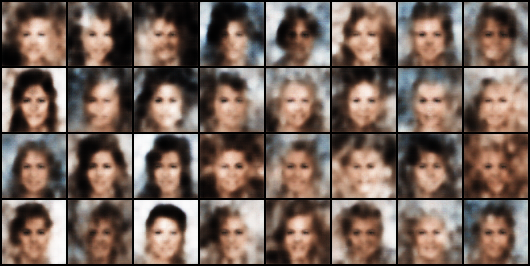

Eval mode


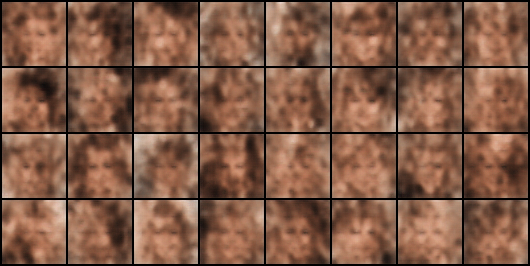

---- [Epoch 3/100, Step 0/156] loss: 282.896118----
Train mode


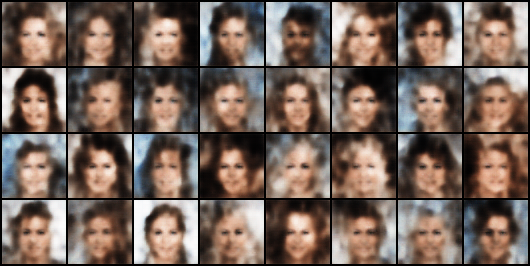

Eval mode


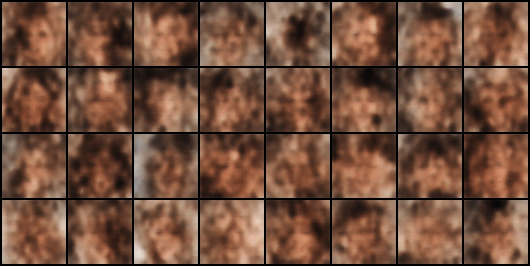

---- [Epoch 3/100, Step 100/156] loss: 263.935638----
Train mode


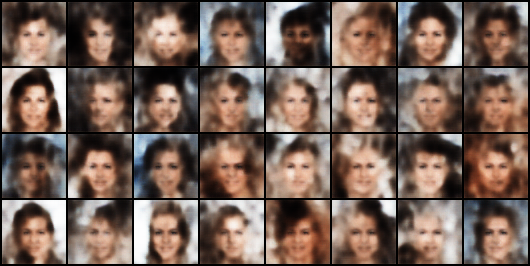

Eval mode


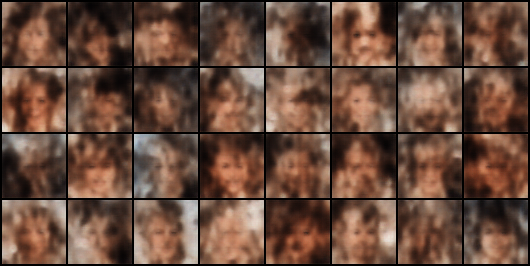

---- [Epoch 4/100, Step 0/156] loss: 275.479675----
Train mode


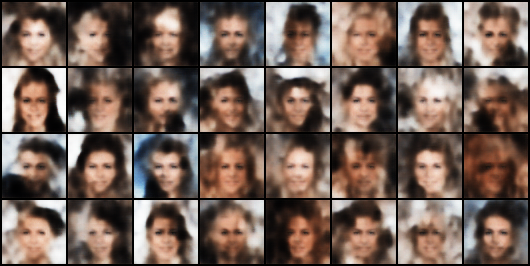

Eval mode


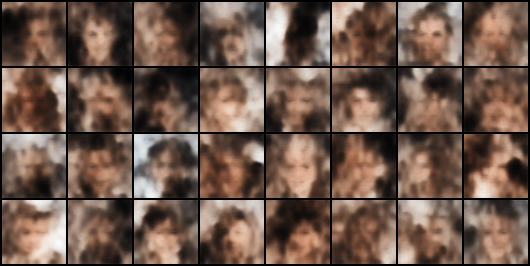

---- [Epoch 4/100, Step 100/156] loss: 265.928314----
Train mode


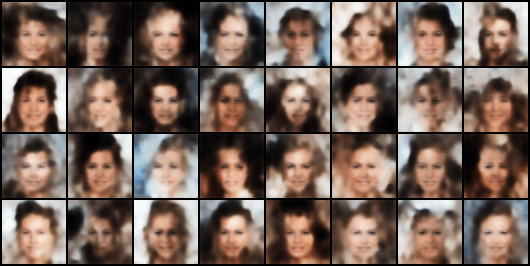

Eval mode


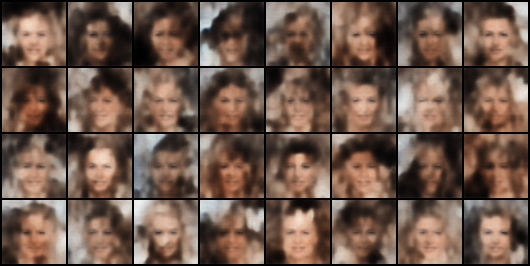

---- [Epoch 5/100, Step 0/156] loss: 254.285217----
Train mode


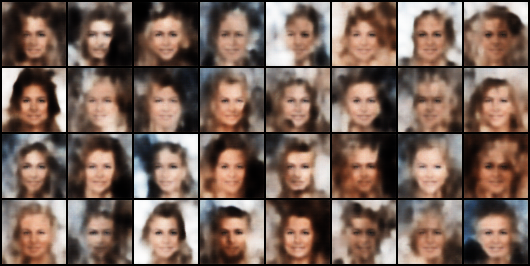

Eval mode


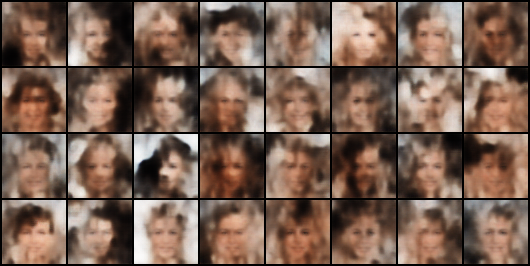

---- [Epoch 5/100, Step 100/156] loss: 251.923141----
Train mode


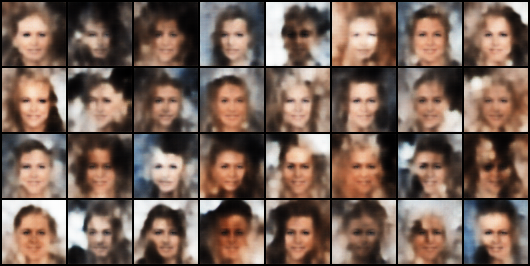

Eval mode


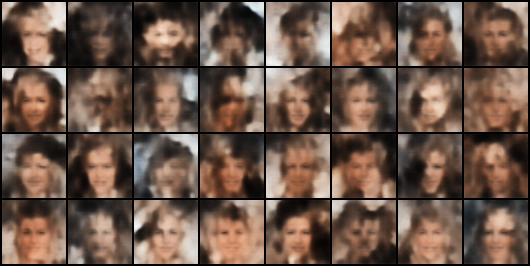

---- [Epoch 6/100, Step 0/156] loss: 244.076157----
Train mode


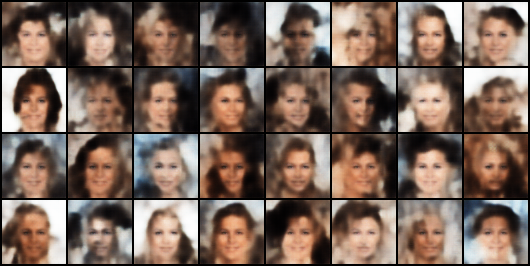

Eval mode


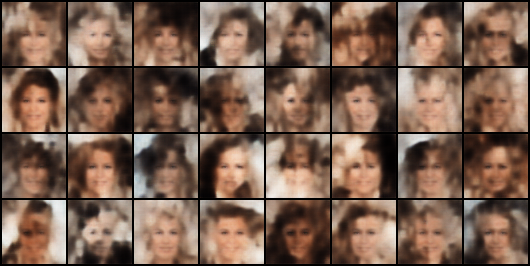

In [ ]:
epochs = 100
batch_size = 128
n_cpu = 2

train_dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=n_cpu)

model = NVAE(z_dim=512, img_dim=(64, 64)).to(device)
# apply Spectral Normalization
model.apply(add_sn)

zshow = torch.randn((batch_size,512,2,2)).to(device)

# folder for checkpoints and visualization:
now = datetime.now()
dt_string = now.strftime("%Y%m%d_%H%M%S")
checkpoints_dir = dt_string+"_checkpoints"
os.makedirs(checkpoints_dir, exist_ok=True)
outputs_dir = dt_string+"_outputs"
os.makedirs(outputs_dir, exist_ok=True)

optimizer = torch.optim.Adamax(model.parameters(), lr=0.01)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=15, eta_min=1e-4)

for epoch in range(epochs):
    model.train() #Set it to train mode

    for i, image in enumerate(train_dataloader):
        optimizer.zero_grad()
        image = image.to(device)
        image_recon, recon_loss, kl_losses = model(image)

        kl_f = 1.
        loss = recon_loss + kl_f*sum(kl_losses)
        loss.backward()
        optimizer.step()

        if i % 100 == 0:
            log_str = "\r---- [Epoch %d/%d, Step %d/%d] loss: %.6f----" % (
            epoch, epochs, i, len(train_dataloader), loss.item())
            print(log_str)
            with torch.no_grad():
                print("Train mode")
                pil_img = show_decoder_output(zshow)
                imgpath = os.path.join(outputs_dir, "nvae_simple_loss_epoch_"+str(epoch).zfill(3)+"_step_"+str(i).zfill(4)+".png")
                pil_img.save(imgpath)
                print("Eval mode")
                model.eval()
                pil_img = show_decoder_output(zshow)
                imgpath = os.path.join(outputs_dir, "nvae_simple_loss_epoch_"+str(epoch).zfill(3)+"_step_"+str(i).zfill(4)+"_eval.png")
                pil_img.save(imgpath)
                model.train()

    # end epoch: save checkpoint:
    scheduler.step()
    if epoch%5==4:
      checkpoint_path = os.path.join(checkpoints_dir, "nvae_simple_loss_epoch_"+str(epoch).zfill(3)+".pth")
      torch.save(model.state_dict(), checkpoint_path)

It does not work very well, but in the toy implementation from: https://github.com/GlassyWing/nvae, there is a few key differences. The training phase lasts 500 epochs and the decoder does not have the same reconstruction loss. The above implementation uses a simple MSE between two images, while the toy implementation uses the adaptive loss function from: https://arxiv.org/abs/1701.03077 coupled with a Binary Cross Entropy loss. Also, in the original implementation, a warm-up loss is used instead of $\mathcal{L}_{VAE}$ during the first $30\%$ of the training. That is, a parameter $\beta$ is annealed as the training progress, reaching $1$ at the end of the training phase.
$$
\mathcal{L}_{VAE}^{W-U} = \mathbb{E}[log(p(\mathbf{x}|\mathbf{z}))] - \beta KL(q(\mathbf{z}|\mathbf{x})||p(\mathbf{z}))
$$

The encoder is identical though.

The difference between eval mode and train mode lies in the forward methods of the neural networks. For example, in eval mode, implicit regularization methods such as batch normalization or drop out are not applied.

### Load pretrained model

File ‘nvae_simple_loss_epoch_199.pth’ already there; not retrieving.
torch.Size([128, 3, 64, 64])


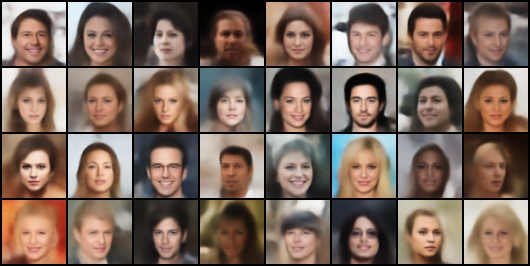

In [ ]:
# Load pretrained model:
!wget -nc -O nvae_simple_loss_epoch_199.pth 'https://www.dropbox.com/scl/fi/0rsjcx78w338nj4ie6lun/nvae_simple_loss_epoch_199.pth?rlkey=8ok3htl9gp3ywmpqu02xdfo87'
checkpoint_path = 'nvae_simple_loss_epoch_199.pth'
model = NVAE(z_dim=512, img_dim=(64, 64)).to(device)
model.apply(add_sn)
model.load_state_dict(torch.load(checkpoint_path, map_location=device), strict=False) #Load the parameters of the pretrained model
model.eval() #Put it to evaluation mode

zshow = torch.randn((batch_size,512,2,2)).to(device)
show_decoder_output(zshow);

### Exercise 3:
1. Complete the function def sample(self, n_samples=32, fix_level=-1) of the encoder class so that it samples images with common realizations up to fix_level.
1. Test this function and verify the hierarchical VAE encodes the images hierarchically.
1. (Bonus question) Sample 20k images and compute FID against the celeba test set (available here https://www.dropbox.com/scl/fi/in8hqobto2p2k2baiwi5x/celeba64png_test.zip?rlkey=jmisq9swucjwjyv69ftwwks06)





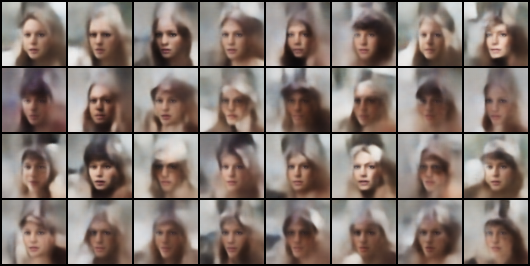

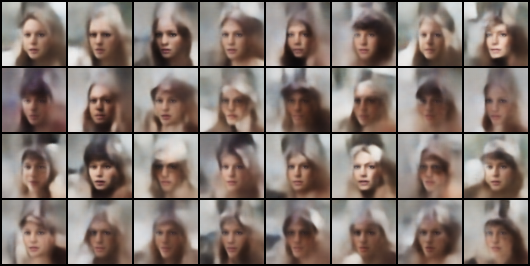

In [ ]:
# TODO sampling
img = model.decoder.sample()
imshow(torchvision.utils.make_grid(img.to('cpu'),nrow=8))